# Reconstruction of portrait images from blur images using Pix2Pix algorithm
## Defining functions to load and blur images
### Importing libraries

In [1]:
import tensorflow as tf
import os
import time
import matplotlib.pyplot as plt
from skimage.filters import gaussian
import numpy as np

### Defining working folders

In [2]:
input_folder = './Train_Gaussian/'
target_train_folder = './Train/'

input_test_folder = './Test_Gaussian/'
target_test_folder = './Test/'

### Load images function

In [3]:
def load_image(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)
    
    #w = tf.shape(image)[1]
    #w = w // 2
    #real_image = image [:, :w, :]
    #input_image = image [ :,w:,:]
    
    #input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(image, tf.float32)
    
    return real_image#input_image, real_image

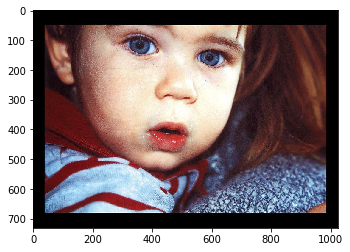

In [4]:
# A sample image from the train folder
sample_img = load_image(target_train_folder + os.listdir(target_train_folder)[0])
plt.figure()
plt.imshow(sample_img/255)

#### Defining the gaussian filter function.
The gaussian filter is applied using the notebook ApplyGaussianFilter over the entire Train and Test Folders, which are after loaded into the rutine. 
For consistency, I show in here how the filter function is applied to every image.

In [5]:
#By default the filter will not apply any blur
#Sigma value is assigned randomly from values 1 to 10
def gaussian_filter(image, sigma=0):
    gaussian_image = gaussian(image, sigma=sigma,multichannel=True)
    gaussian_image = tf.cast(gaussian_image, tf.float32)
    return gaussian_image

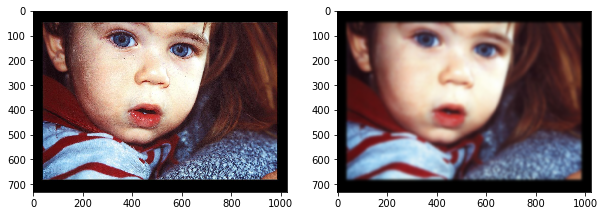

In [6]:
# Applying the gaussian filter to our sample image
# We must divide the image by 255 to be able to plot the image
gaussian_sample_img = gaussian_filter(sample_img, sigma=5)
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(sample_img/255)
plt.subplot(1,2,2)
plt.imshow(gaussian_sample_img/255)

### Defining resizing and cropping images to fit the CNet
We must take into account that the input and target images will be have to be treate equally. For that reason
next functions the parameters have input and real image defined

In [7]:
#The Pix2Pix rutine takes by default the following values for image height and width.
#This is done accordanly to the number of input nodes in the Network
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [8]:
#This function is in charge to resize the image to a more proper value
#Afterwards the image will be randomly cropped to the designed height and width = 256.
def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    
    return input_image, real_image

In [9]:
def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(
        stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])
    
    return cropped_image[0], cropped_image[1]

In [10]:
# normalizing the images to [-1, 1] for better training in tensorflow

def normalize(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1
    return input_image, real_image

In [11]:
# Random jitter is used later for  the data generator, to "augment" the number of data for training
@tf.function()
def random_jitter(input_image, real_image):
    #resize images to 286x286x3
    input_image, real_image = resize(input_image, real_image,286,286)
    
    # randomly cropping to 256 x 256 x 3
    input_image, real_image = random_crop(input_image, real_image)

    if tf.random.uniform(()) > 0.5:
    # random mirroring
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)
    
    return input_image, real_image

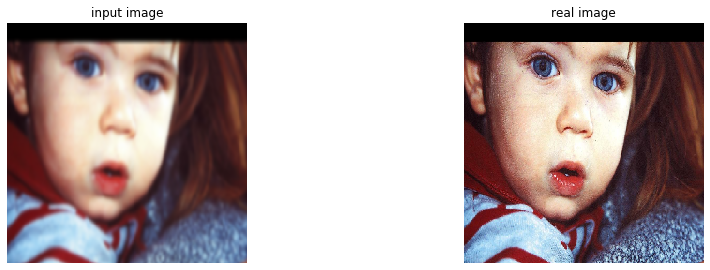

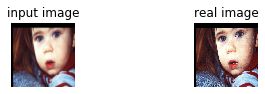

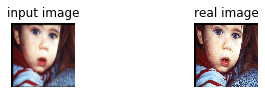

In [12]:
#An example of who random_jitter works
plt.figure(figsize=(15, 15))
for i in range(1,4):
    rj_inp, rj_re = random_jitter(gaussian_sample_img, sample_img)
    plt.subplot(3, 2, (2*i-1))
    plt.imshow(rj_inp/255.0)
    plt.title('input image')
    plt.axis('off')
    plt.subplot(3,2, (i*2))
    plt.imshow(rj_re/255.0)
    plt.title('real image')
    plt.axis('off')
    plt.show()

## Load train input and target images

In [13]:
## Need to define a load image for training images and another function for test. Test images do not pass for jitter function
## Sigma is defined randomly with the random uniform function with values between 1 to 10
def load_image_train(image_file):
    real_image = load_image(target_train_folder + image_file)
    input_image = load_image(input_folder + image_file)
    
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)
   
    return input_image, real_image

In [14]:
#In this function the image test is not pass for random_jitter function
def load_image_test(image_file):
    real_image = load_image(target_test_folder + image_file)
    input_image = load_image(input_test_folder + image_file)
    
    input_image, real_image = resize(input_image, real_image,IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize(input_image, real_image)
    
    return input_image, real_image

### Creating the pipeline
Defining the batch size and buffer

In [15]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
train_imgs = !ls -1 "{target_train_folder}"
test_imgs = !ls -1 "{target_test_folder}"

#tr_tg = np.arange(os.listdir(target_train_folder))
#tr_inp = np.arange(len(os.listdir(output_folder)))
#print(test_imgs)

In [16]:

train_dataset = tf.data.Dataset.from_tensor_slices(os.listdir(target_train_folder))
train_dataset = train_dataset.map(load_image_train, num_parallel_calls = tf.data.experimental.AUTOTUNE)

train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [17]:
test_dataset = tf.data.Dataset.from_tensor_slices(test_imgs)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Building the generator
From this point the code is almost exactly as shown in the pix2pix tutorial

In [18]:
#Building the generator
from keras.models import Sequential
from keras.layers import Conv2D, BatchNormalization, LeakyReLU
OUTPUT_CHANNELS = 3

Using TensorFlow backend.


In [19]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',kernel_initializer=initializer, use_bias=False))
    
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
        
    result.add(tf.keras.layers.LeakyReLU())

    return result

In [20]:
# Upsample to decoder section
def upsample(filters, size, apply_dropout=False):
    
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,padding='same', 
                                               kernel_initializer=initializer,use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())
    
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    
    result.add(tf.keras.layers.ReLU())
    
    return result

In [21]:
def Generator():
    
    inputs = tf.keras.layers.Input(shape=[256,256,3])
    
    #pipeline
    down_stack = [downsample(64,4, apply_batchnorm=False),#(bs, 128,128,64)
                  downsample(128,4),
                  downsample(256, 4),
                  downsample(512, 4),
                  downsample(512, 4),
                  downsample(512, 4),
                  downsample(512, 4),
                  downsample(512, 4)] 
    up_stack = [ upsample(512,4, apply_dropout=True),
                upsample(512,4, apply_dropout=True),
                upsample(512,4, apply_dropout=True),
                upsample(512,4),
                upsample(256,4),
                upsample(128,4),
                upsample(64,4)]
    
    initializer = tf.random_normal_initializer(0.,0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides = 2, padding='same',
                                          kernel_initializer=initializer, activation='tanh')

    x = inputs
    
    #Downsampling throug the model
    
    skips = []
    
    for down in down_stack:
        
        x = down(x)
        skips.append(x)
        
        
    skips = reversed(skips[:-1])
    
    #upsampling and establishing the skip connections
    
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])
        
    x = last(x)
    
    return tf.keras.Model(inputs = inputs, outputs = x)
        

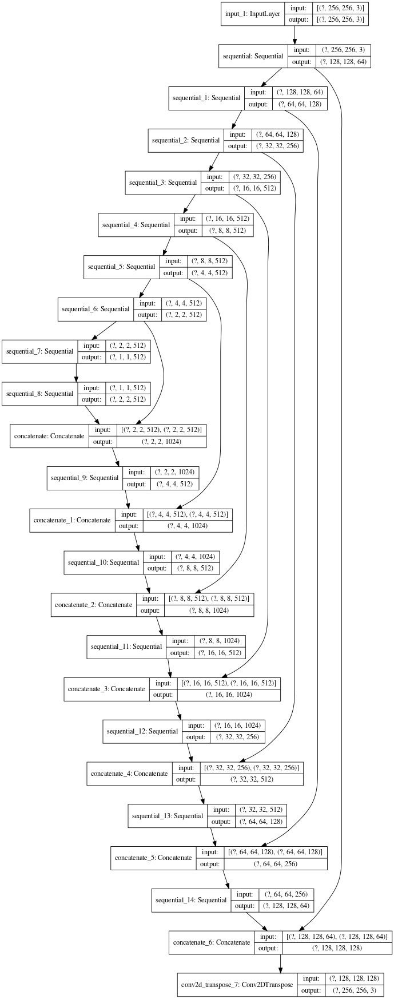

In [22]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi = 64)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


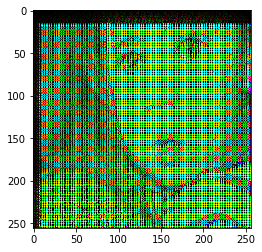

In [26]:
#This is how an image looks after passing through the model without training
rgsi,rtsi = random_jitter(gaussian_sample_img, sample_img)
get_output = generator(rtsi[tf.newaxis,...], training = False)
plt.imshow(get_output[0,...])

Time to define the loss metrics for training

In [28]:
LAMBDA = 100

In [29]:
def generator_loss(disc_generated_output, gen_output, target):
    
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    
    #mae
    
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    
    return total_gen_loss, gan_loss, l1_loss


In [30]:
#DISCRIMINATOR which qualifies the image as real or as fake

def Discriminator():
    
    initializer = tf.random_normal_initializer(0.,0.02)
    
    inp = tf.keras.layers.Input(shape =[256,256,3], name = 'input_image')
    tar = tf.keras.layers.Input(shape = [256,256,3], name = 'target_image')
    
    x = tf.keras.layers.concatenate([inp, tar])
    
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128,4)(down1)
    down3 = downsample(256, 4)(down2)
    
    
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1)
    
    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)
    
    
    last = tf.keras.layers.Conv2D(1,4, strides = 1, kernel_initializer=initializer)(zero_pad2)
    
    return tf.keras.Model(inputs = [inp,tar], outputs = last)
    

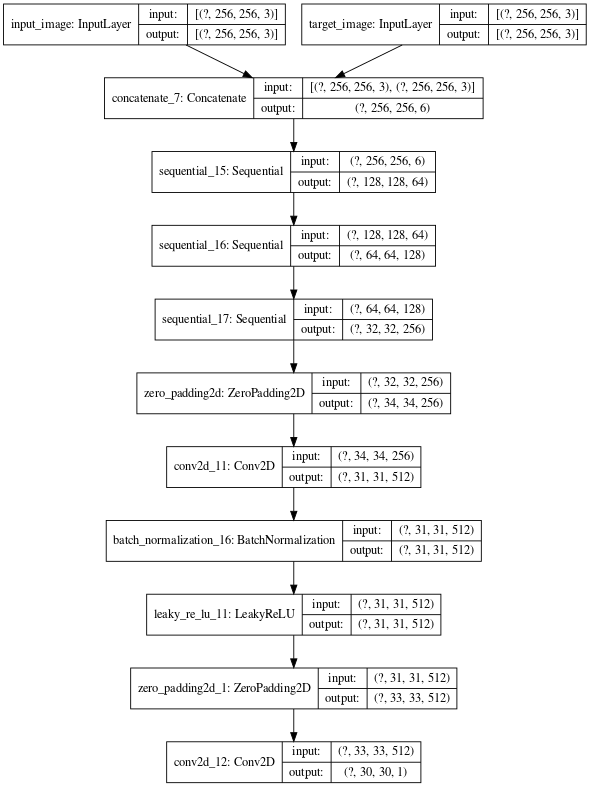

In [31]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi = 64)

In [32]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [33]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    
    total_disc_loss = real_loss + generated_loss
    
    return total_disc_loss

In [34]:
#optimizers and checkpoint

generator_optimizer = tf.keras.optimizers.Adam(2e-4,beta_1 = 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer, 
                                 discriminator_optimizer=discriminator_optimizer, 
                                 generator = generator,
                                 discriminator = discriminator)


In [35]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))
    
    display_list = [test_input[0], tar[0], prediction[0]]
    
    title = ['Input Image', 'Ground Truth', 'Predicted Image']
    
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    
    plt.show()

A test image will be displayed after a number of epochs (5 as a first attempt). 
The first image is how it is set into the network, the second one the target image and the later one will 
show the predicted image.

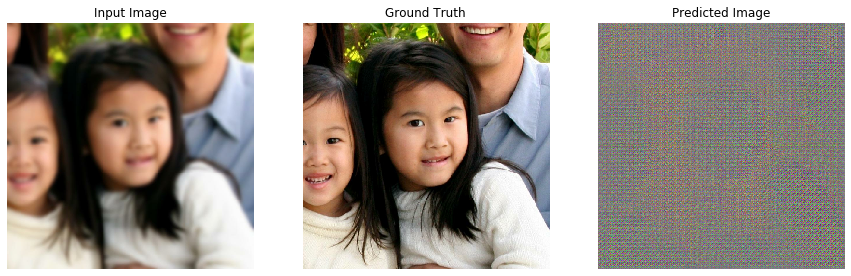

In [37]:
for example_input, example_target in test_dataset.take(1):
    generate_images(generator, example_input, example_target)

In [38]:
EPOCHS = 100

In [39]:
@tf.function
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)
        
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
    
    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(generator_gradients,
                                        generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                            discriminator.trainable_variables))
    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
        tf.summary.scalar('disc_loss', disc_loss, step=epoch)

In [40]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [184]:
def fit(train_ds, epochs, test_ds):
    for epoch in range(epochs):
        start = time.time()

    #isplay.clear_output(wait=True)

        for example_input, example_target in test_ds.take(1):
            generate_images(generator, example_input, example_target)
        print("Epoch: ", epoch)

    # Train
        for n, (input_image, target) in train_ds.enumerate():
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
            train_step(input_image, target, epoch)
        print()

    # saving (checkpoint) the model every 5 epochs
        if (epoch + 1) % 5 == 0:
            checkpoint.save(file_prefix = checkpoint_prefix)
        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,time.time()-start))
    checkpoint.save(file_prefix = checkpoint_prefix)

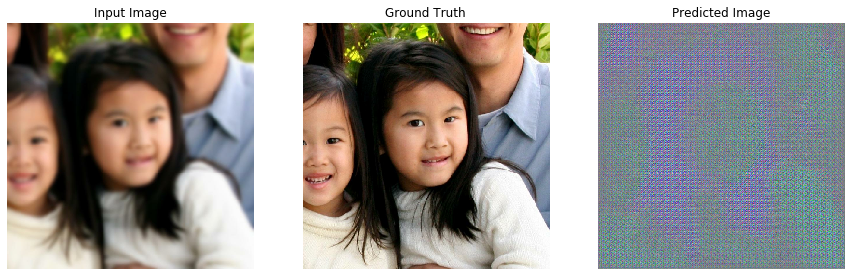

Epoch:  0
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

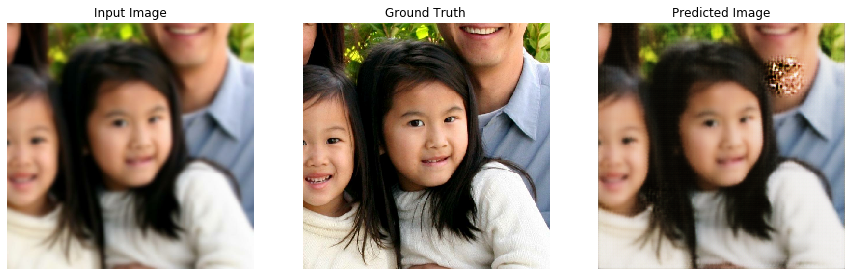

Epoch:  1
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

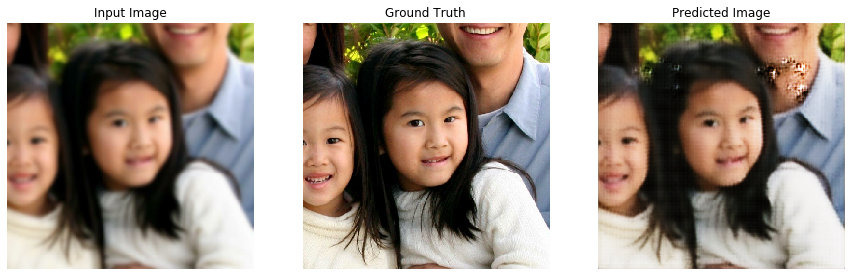

Epoch:  2
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

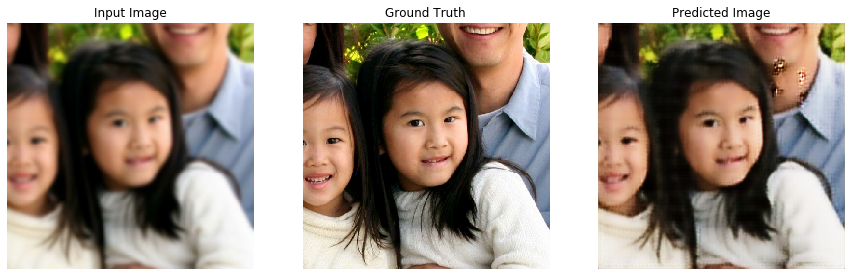

Epoch:  3
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

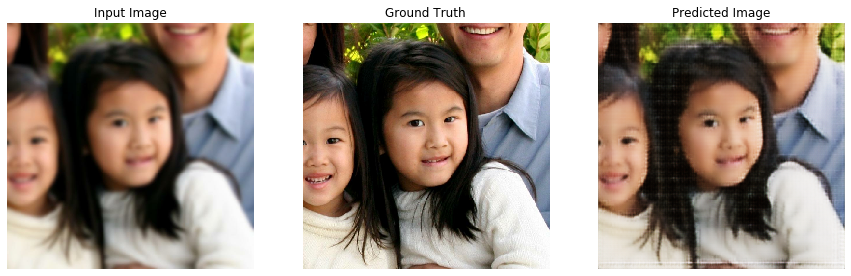

Epoch:  4
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

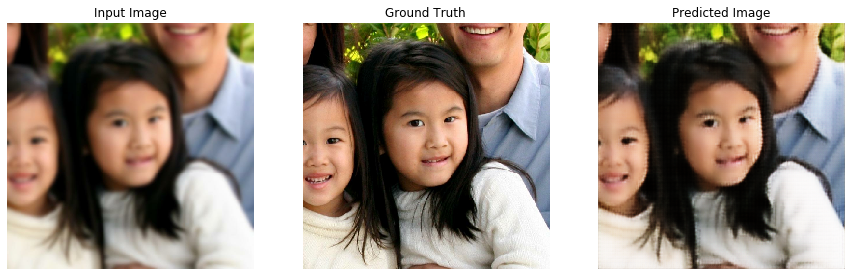

Epoch:  5
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

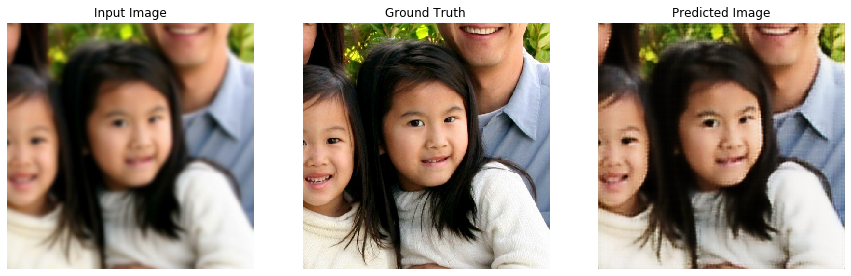

Epoch:  6
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

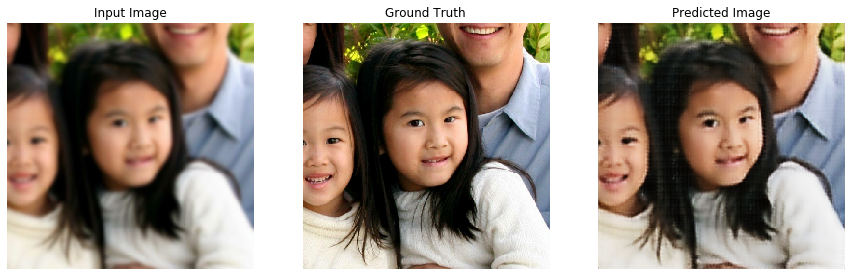

Epoch:  7
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

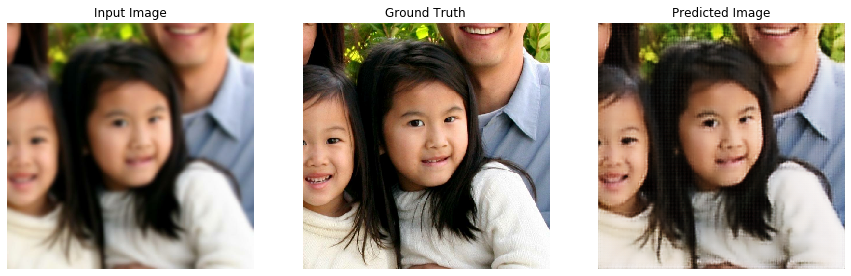

Epoch:  8
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

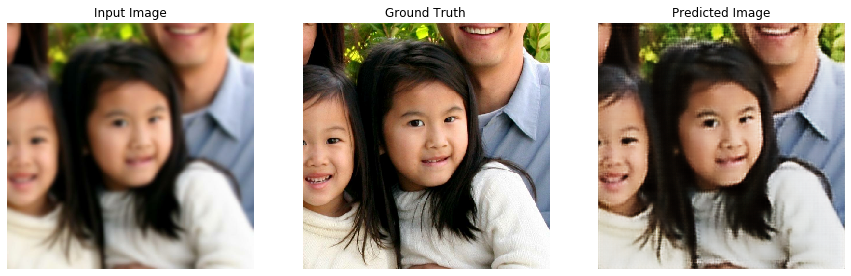

Epoch:  9
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

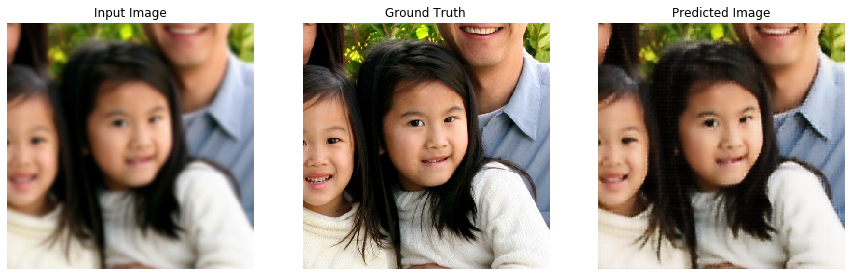

Epoch:  10
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

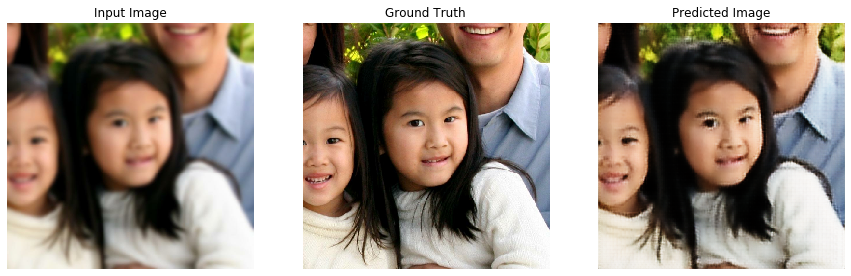

Epoch:  11
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

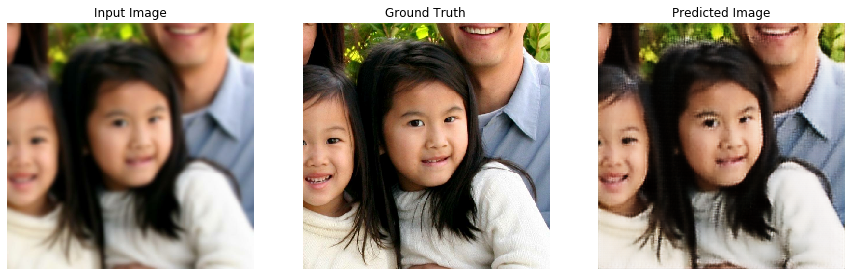

Epoch:  12
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

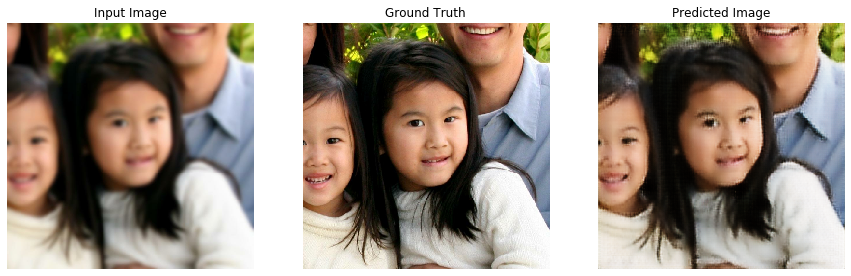

Epoch:  13
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

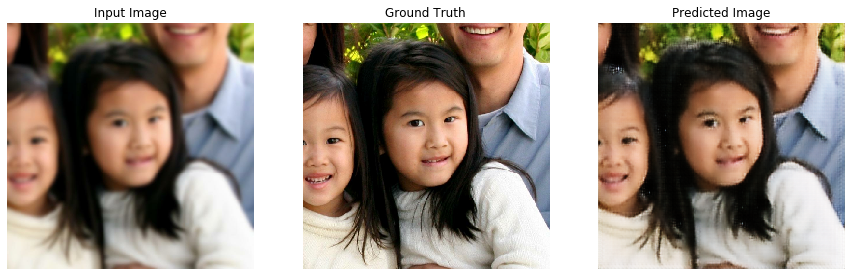

Epoch:  14
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

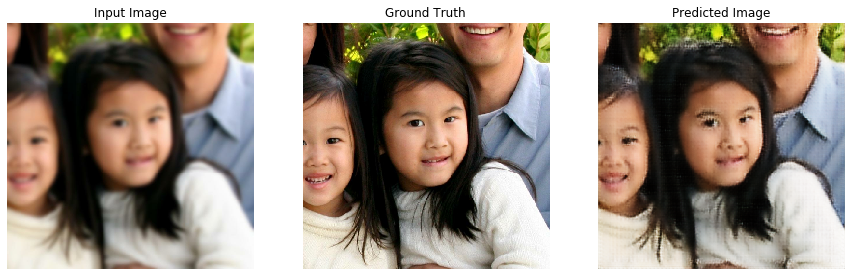

Epoch:  15
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

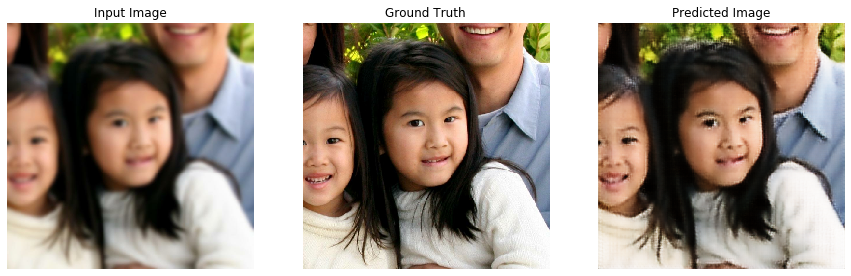

Epoch:  16
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

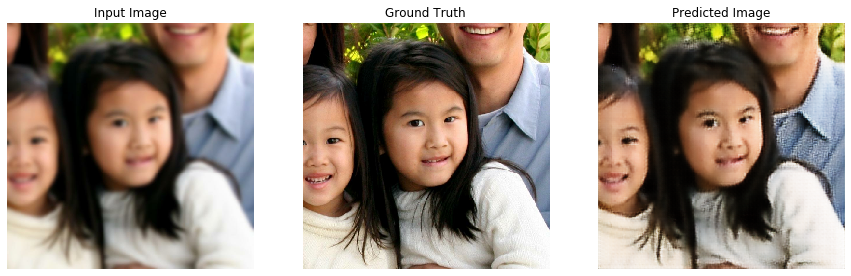

Epoch:  17
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

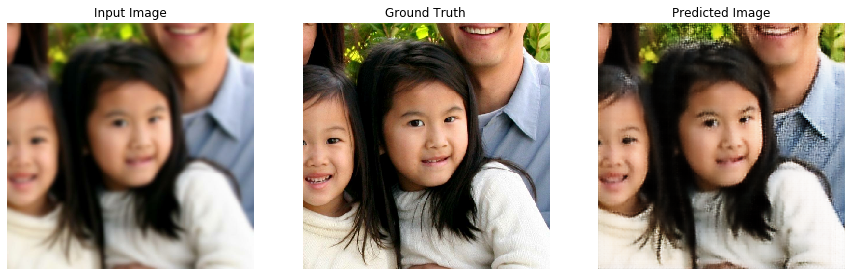

Epoch:  18
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

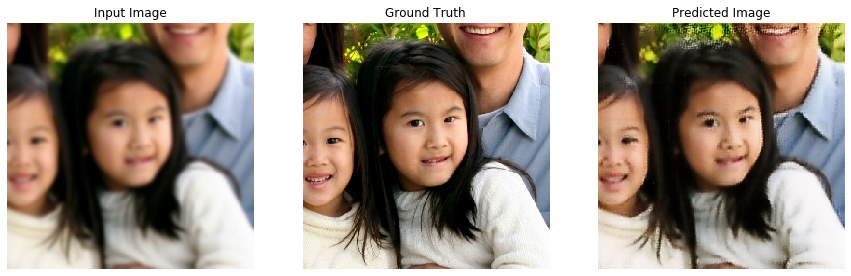

Epoch:  19
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

NameError: name 'checkpo' is not defined

In [186]:
fit(train_dataset, EPOCHS, test_dataset)

## Results after 20 epochs

In [191]:
generator.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
sequential_3 (Sequential)       (None, 64, 64, 128)  131584      sequential_2[0][0]               
__________________________________________________________________________________________________
sequential_4 (Sequential)       (None, 32, 32, 256)  525312      sequential_3[0][0]               
______________________________________________________________________________________________

### See 15 images of the test set

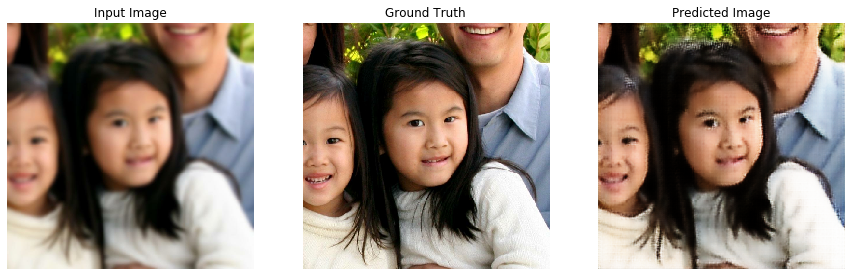

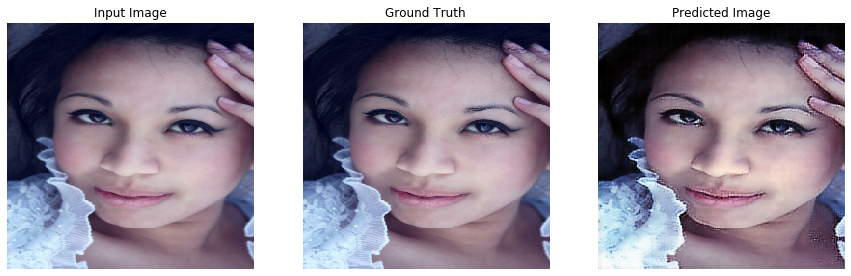

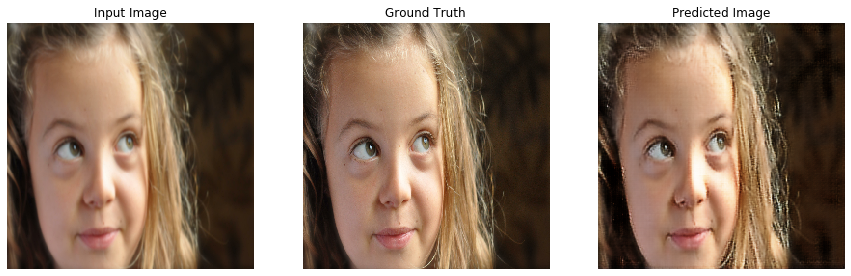

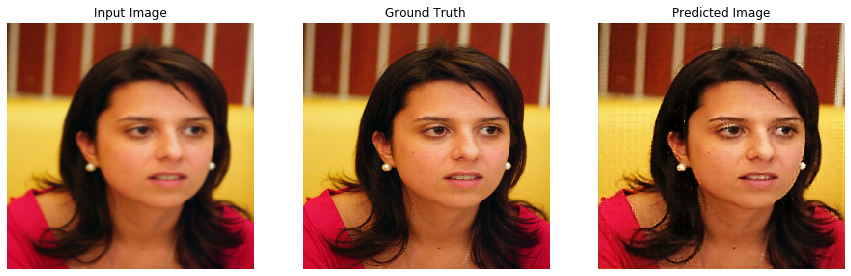

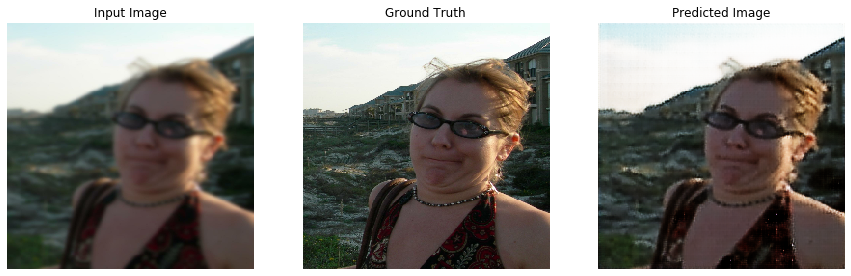

...

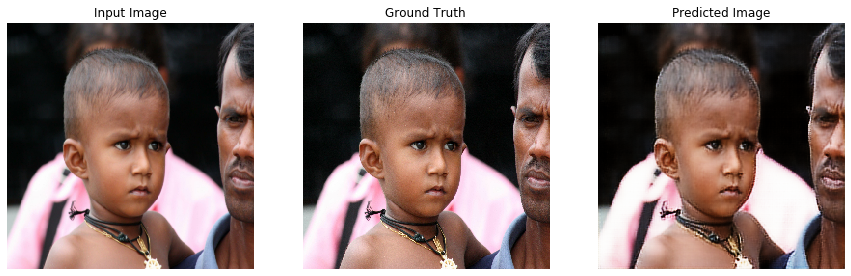

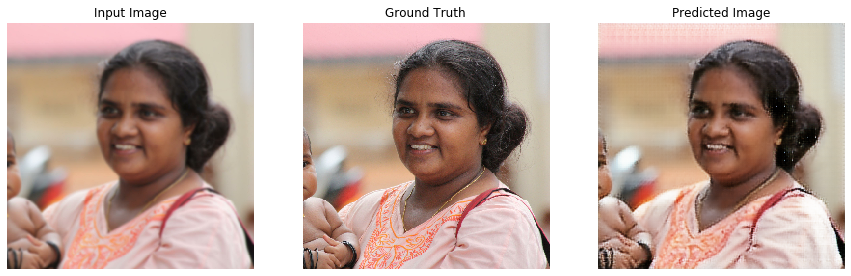

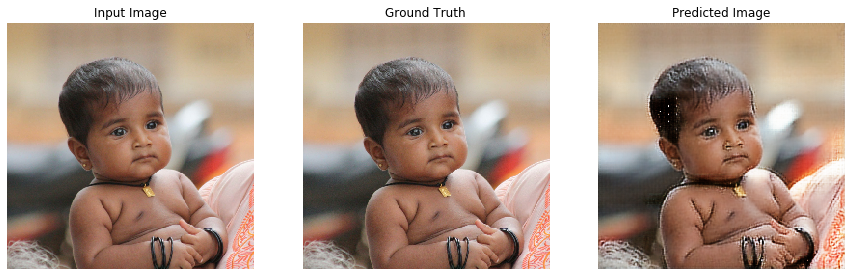

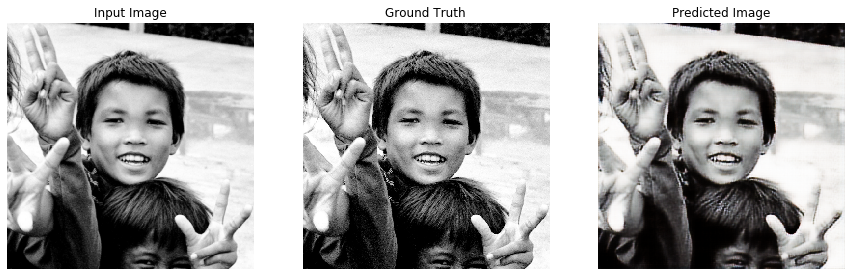

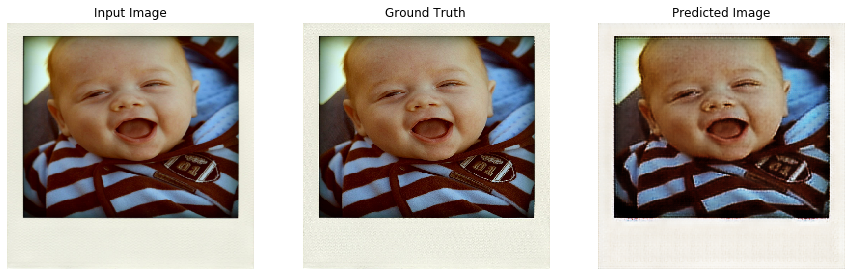

In [195]:
for example_input, example_target in test_dataset.take(15):
    generate_images(generator, example_input, example_target)

In [ ]:
# Loads the weights
#model.load_weights(checkpoint_path)

# Re-evaluate the model
#loss,acc = model.evaluate(test_images,  test_labels, verbose=2)

In [193]:
generator.save('gan_image_sharpening_epochs.hdf5')

In [194]:
generator.save_weights('gan_image_sharpening_epochs_weights.h5')

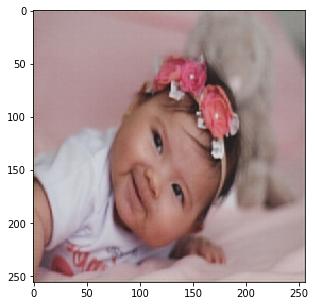

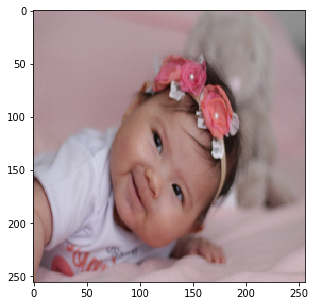

In [230]:
gianna = load_image('./gianna.jpg')
gianna_rz, gianna_2 = random_jitter(gianna, gianna)
gianna_rz, gianna_2 = normalize(gianna_rz, gianna_2)
prediction = generator(gianna_2[tf.newaxis,...], training=False)
plt.figure(figsize=(5,5))
plt.imshow((prediction[0,...]+1)/2)
plt.figure(figsize=(5,5))
plt.imshow((gianna_2+1)/2)
